In [9]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import calendar
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

col_pal = sns.color_palette()

In [25]:
df = pd.read_csv('monroe county car crach 2003-2015.csv', encoding='latin1')
df.head()

,Year,Month,Day,Weekend?,Hour,Collision Type,Injury Type,Primary Factor,Reported_Location,Latitude,Longitude
0,2015,1,5,Weekday,0.0,2-Car,No injury/unknown,OTHER (DRIVER) - EXPLAIN IN NARRATIVE,1ST & FESS,39.159207,-86.525874
1,2015,1,6,Weekday,1500.0,2-Car,No injury/unknown,FOLLOWING TOO CLOSELY,2ND & COLLEGE,39.161440,-86.534848
2,2015,1,6,Weekend,2300.0,2-Car,Non-incapacitating,DISREGARD SIGNAL/REG SIGN,BASSWOOD & BLOOMFIELD,39.149780,-86.568890
3,2015,1,7,Weekend,900.0,2-Car,Non-incapacitating,FAILURE TO YIELD RIGHT OF WAY,GATES & JACOBS,39.165655,-86.575956
4,2015,1,7,Weekend,1100.0,2-Car,No injury/unknown,FAILURE TO YIELD RIGHT OF WAY,W 3RD,39.164848,-86.579625


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53943 entries, 0 to 53942
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               53943 non-null  int64  
 1   Month              53943 non-null  int64  
 2   Day                53943 non-null  int64  
 3   Weekend?           53875 non-null  object 
 4   Hour               53718 non-null  float64
 5   Collision Type     53937 non-null  object 
 6   Injury Type        53943 non-null  object 
 7   Primary Factor     52822 non-null  object 
 8   Reported_Location  53908 non-null  object 
 9   Latitude           53913 non-null  float64
 10  Longitude          53913 non-null  float64
dtypes: float64(3), int64(3), object(5)
memory usage: 4.5+ MB


In [29]:
df.duplicated().sum()

64

In [31]:
df = df.drop_duplicates()

In [33]:
df.isnull().sum()

Year                    0
Month                   0
Day                     0
Weekend?               68
Hour                  225
Collision Type          6
Injury Type             0
Primary Factor       1119
Reported_Location      35
Latitude               30
Longitude              30
dtype: int64

In [35]:
df.dropna(inplace=True)
df.shape

(52520, 11)

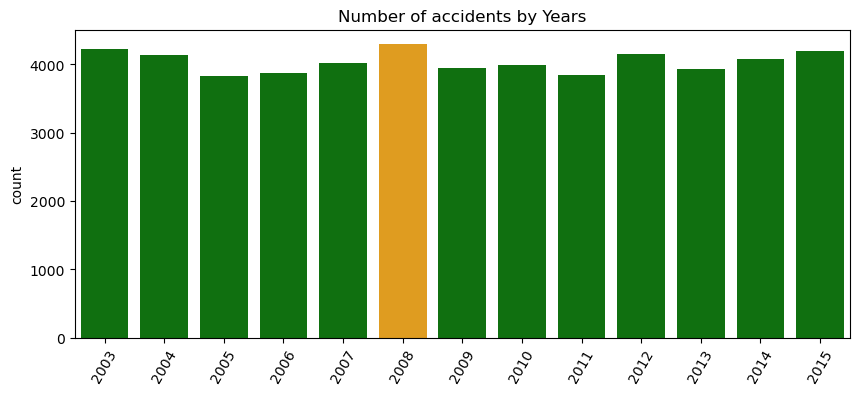

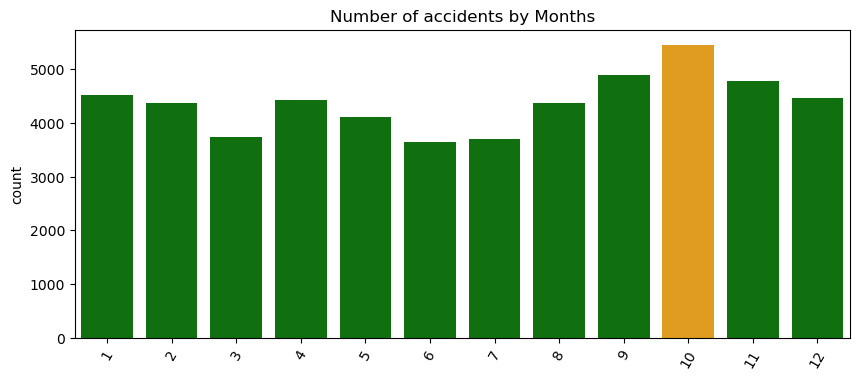

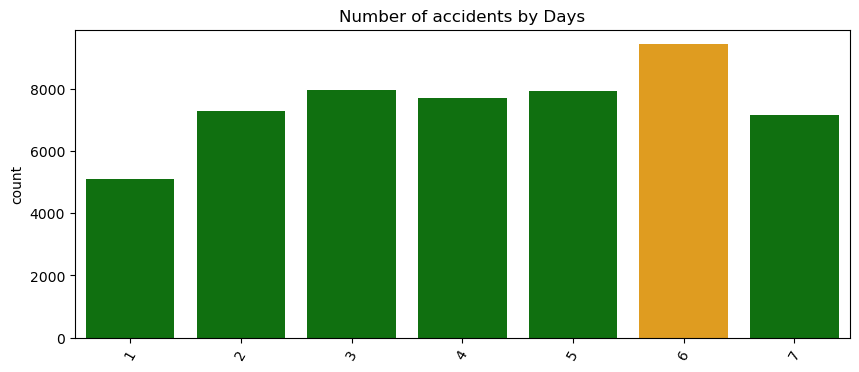

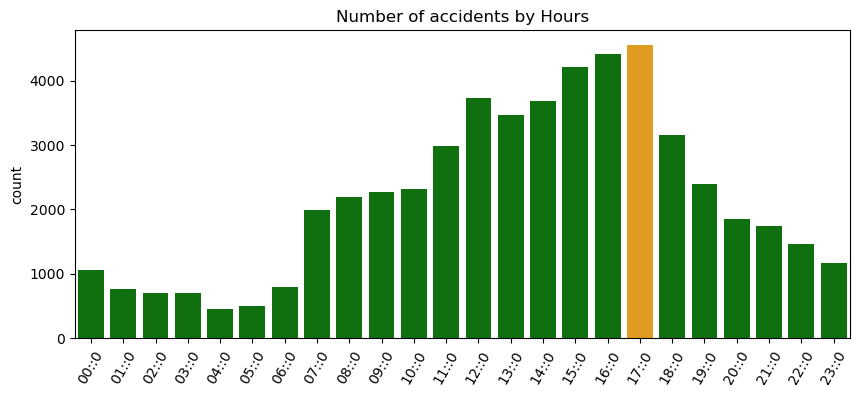

In [41]:
group_list = ["Year", "Month", "Day", "Hour"]

for i in group_list:
    grouped = df.groupby(i)[i].count().reset_index(name="count")
    
    plt.figure(figsize=(10,4))
    cols = ["green" if (i < max(grouped["count"])) else "orange" for i in grouped["count"]]
    sns.barplot(data=grouped, x= i, y="count", palette=cols)
    plt.title(f"Number of accidents by {i}s")
    plt.xticks(rotation=60)
    plt.xlabel("")
    plt.show()


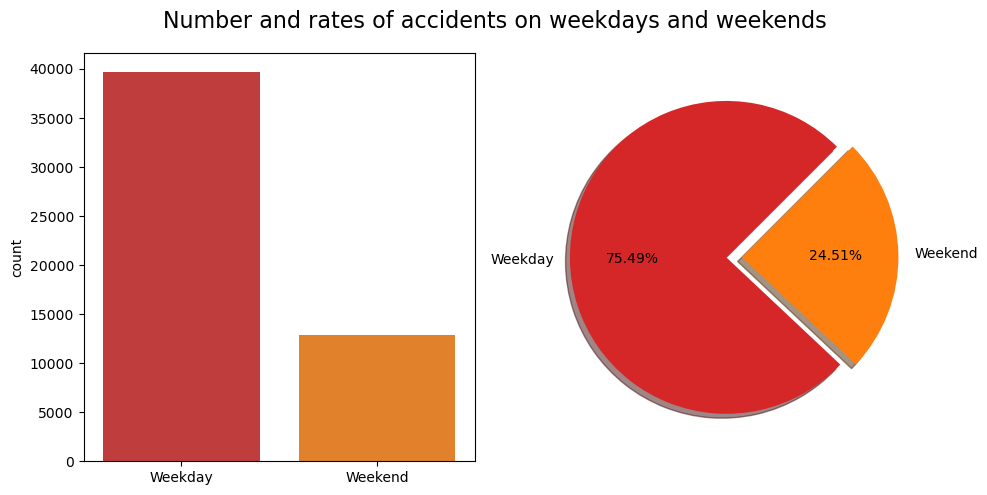

In [43]:
grouped_week = df.groupby("Weekend?")["Weekend?"].count().reset_index(name="count")
grouped_week
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
cols = [col_pal[3], col_pal[1]]
sns.barplot(x=grouped_week["Weekend?"], y=grouped_week["count"], palette=cols)
plt.xlabel("")
plt.subplot(1,2,2)
plt.pie(x=grouped_week["count"], labels=grouped_week["Weekend?"], shadow=True,
        explode=[0.1, 0], startangle=45, autopct='%0.2f%%', colors=cols)
plt.suptitle("Number and rates of accidents on weekdays and weekends", fontsize=16)
plt.tight_layout()
plt.show()


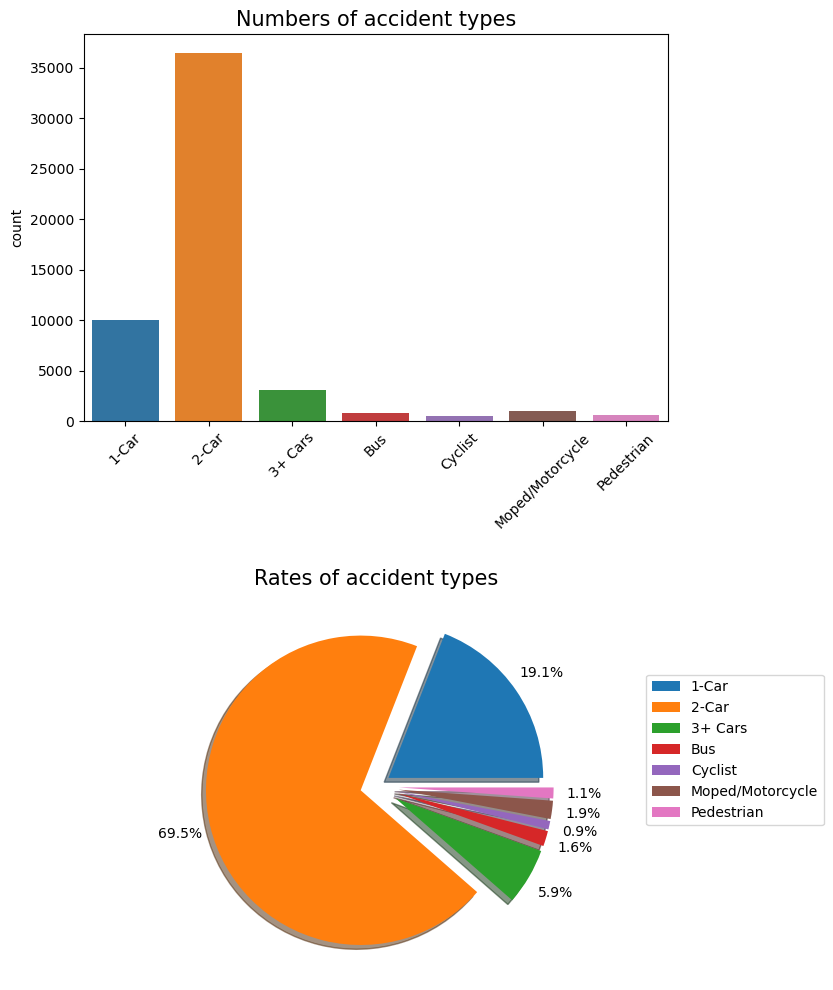

In [47]:
grouped_collision_type = df.groupby("Collision Type").size().reset_index(name="count")
plt.figure(figsize=(8,10))
plt.subplot(2,1,1)
cols = [col_pal[0], col_pal[1], col_pal[2], col_pal[3], col_pal[4], col_pal[5], col_pal[6]]
sns.barplot(x=grouped_collision_type["Collision Type"], y=grouped_collision_type["count"], palette=cols)
plt.xlabel("")
plt.xticks(rotation=45)
plt.title("Numbers of accident types", fontsize=15)
plt.subplot(2,1,2)
plt.pie(x=grouped_collision_type["count"], shadow=True, autopct='%0.1f%%', colors=cols, pctdistance=1.2,
        explode=[0.1,0.1,0.15,0.15,0.15,0.15,0.15])
plt.legend(loc=(1.2, 0.4), labels=grouped_collision_type["Collision Type"])
plt.title("\nRates of accident types", fontsize=15)
plt.tight_layout()
plt.show()


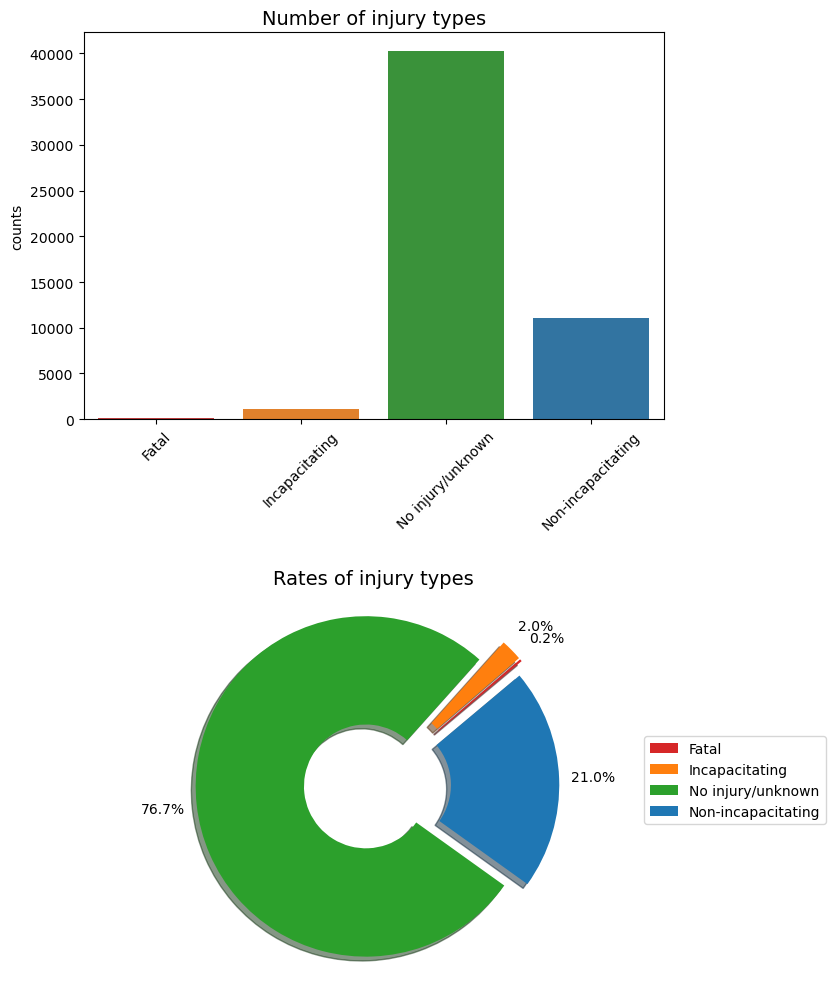

In [49]:
grouped_injury_type = df.groupby("Injury Type").size().reset_index(name="counts")
plt.figure(figsize=(8,10))
plt.subplot(2,1,1)
cols = [col_pal[3], col_pal[1], col_pal[2], col_pal[0]]
sns.barplot(x=grouped_injury_type["Injury Type"], y=grouped_injury_type["counts"], palette=cols)
plt.xlabel("")
plt.xticks(rotation=45)
plt.title("Number of injury types", fontsize=14)
plt.subplot(2,1,2)
plt.pie(x=grouped_injury_type["counts"], shadow=True, autopct='%0.1f%%', colors=cols, pctdistance=1.2,
        radius=1.4-0.3, wedgeprops=dict(width=0.7), startangle=40, explode=[0.15,0.15,0.05,0.10])
plt.legend(loc=(1.2, 0.4), labels=grouped_injury_type["Injury Type"])
plt.title("\nRates of injury types", fontsize=14)
plt.tight_layout()
plt.show()


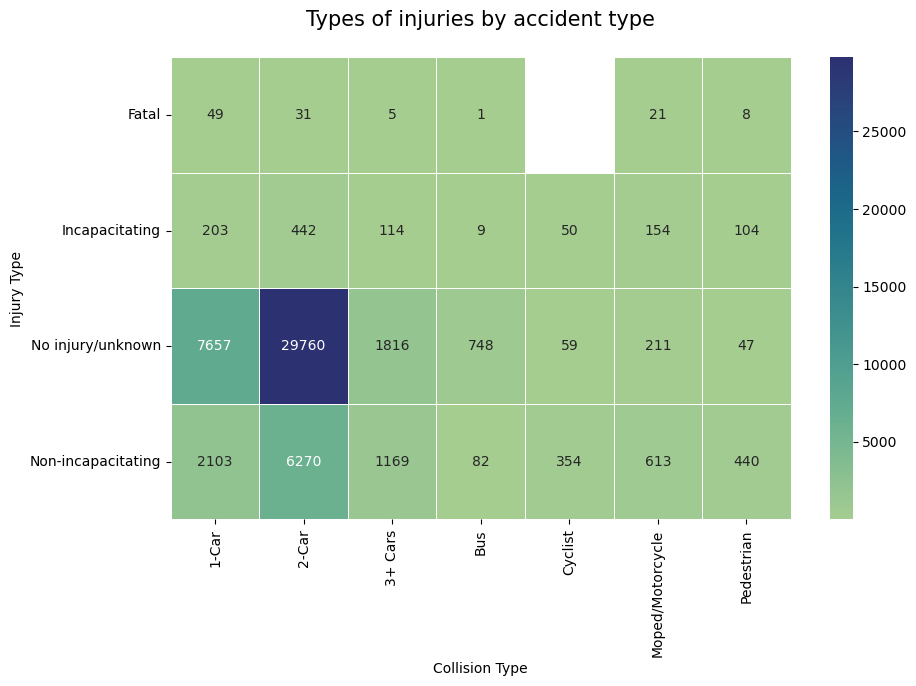

In [51]:
grouped_injury_type = df.groupby(["Collision Type", "Injury Type"]).size().reset_index(name="counts")
grouped_injury_type = df.groupby(["Injury Type", "Collision Type"]).size().unstack()
grouped_injury_type.head()

plt.figure(figsize=(10,6))
sns.heatmap(grouped_injury_type, annot=True, lw=0.4, fmt=".5g", cmap="crest")
plt.title("Types of injuries by accident type\n", fontsize=15)
print("")
plt.show()


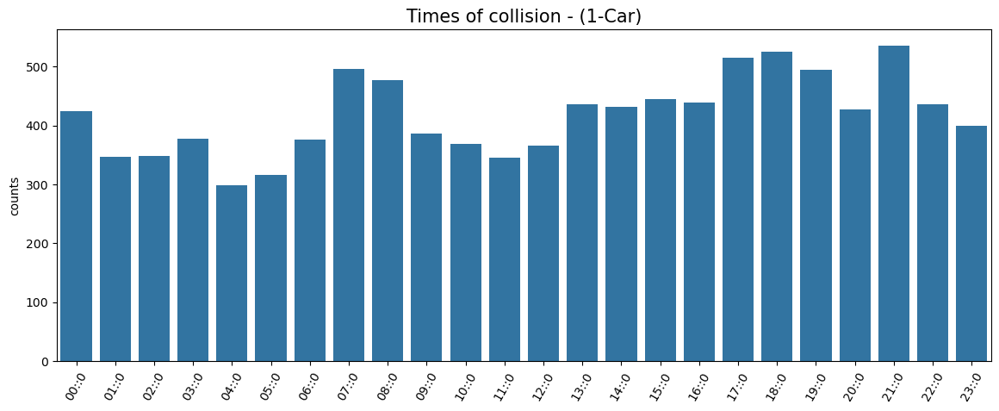

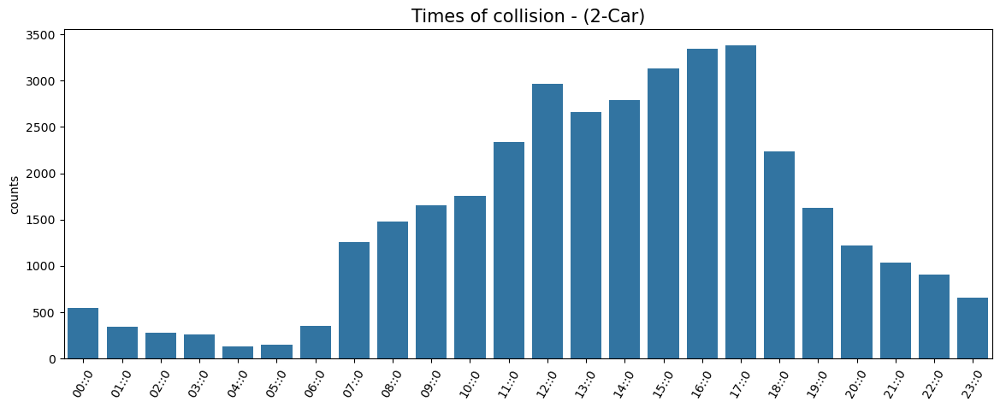

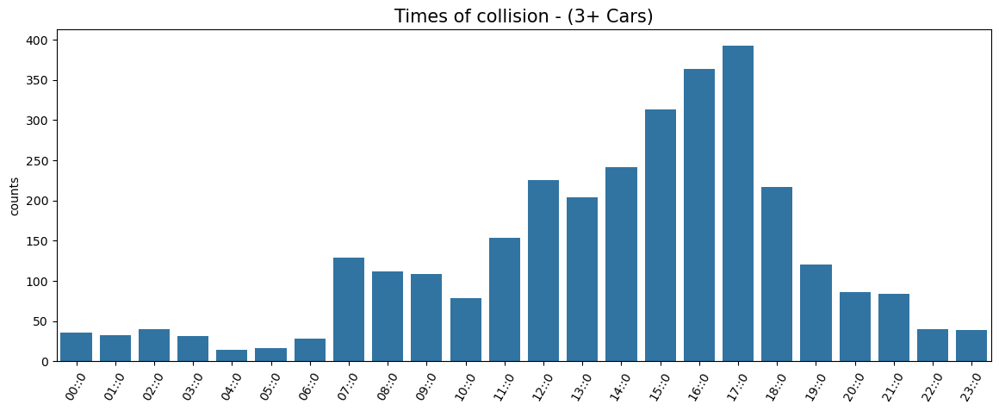

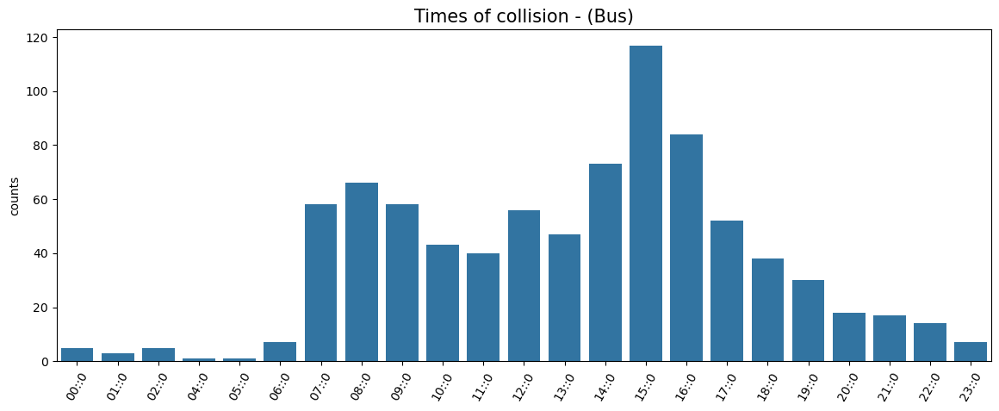

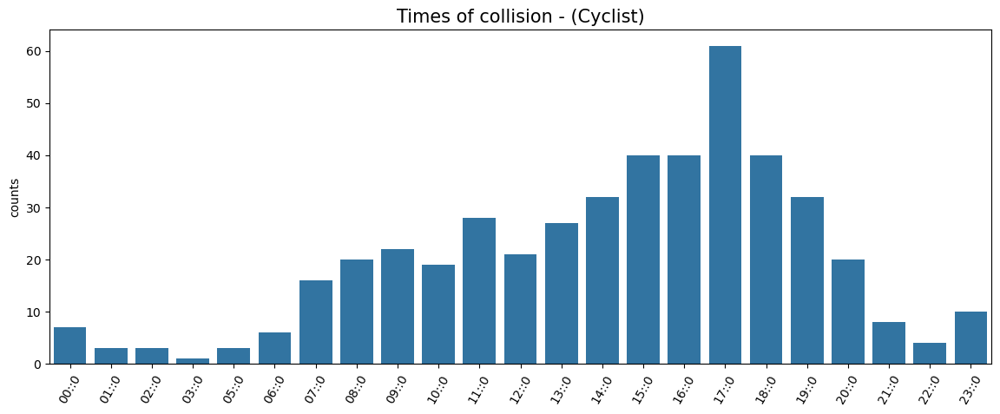

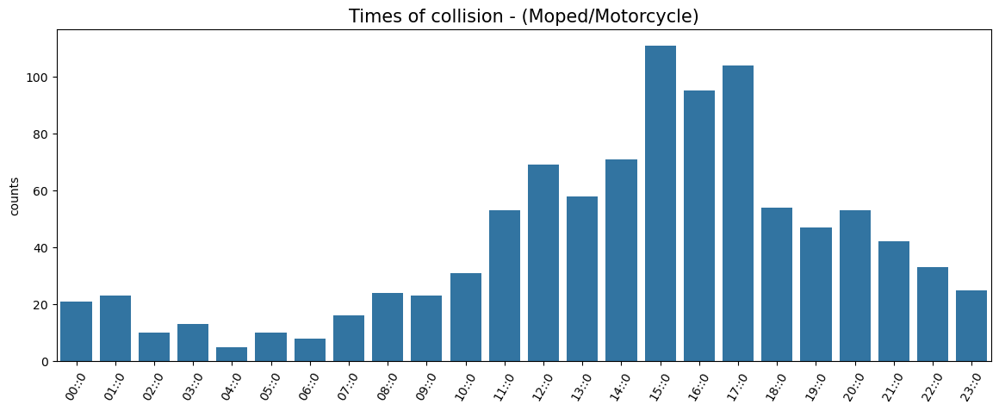

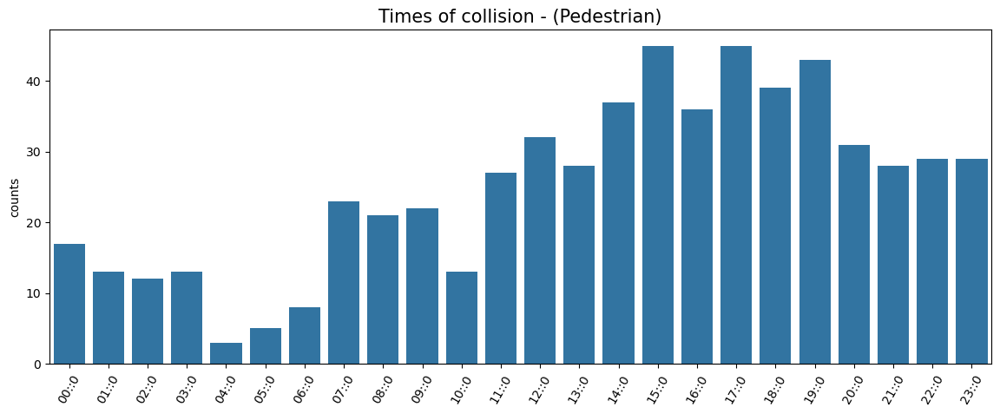

In [53]:
grouped_Collision = df.groupby(["Collision Type", "Hour"]).size().reset_index(name="counts")
grouped_Collision.head()
for i in grouped_Collision["Collision Type"].unique():
    collision_type = grouped_Collision[grouped_Collision["Collision Type"] == i]
    
    plt.figure(figsize=(14,5))
    sns.barplot(data=collision_type, x="Hour", y="counts", color=col_pal[0])
    plt.title(f"Times of collision - ({i})", fontsize=15)
    plt.xlabel("")
    plt.xticks(rotation=60)
    plt.show()


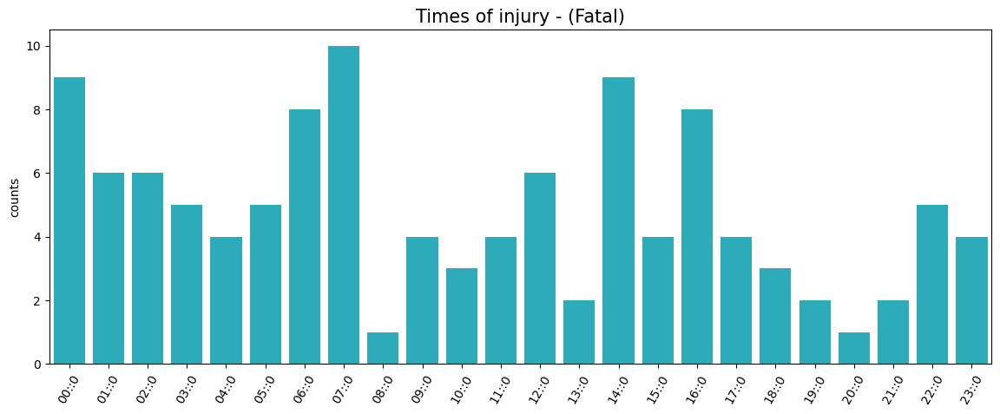

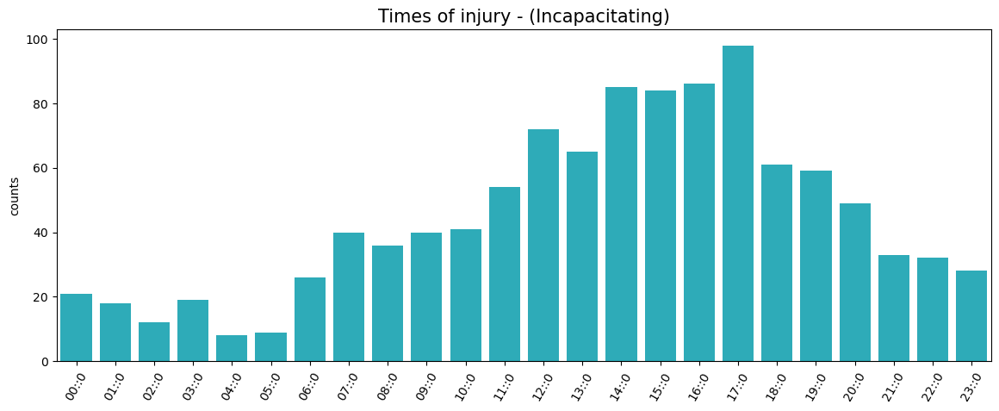

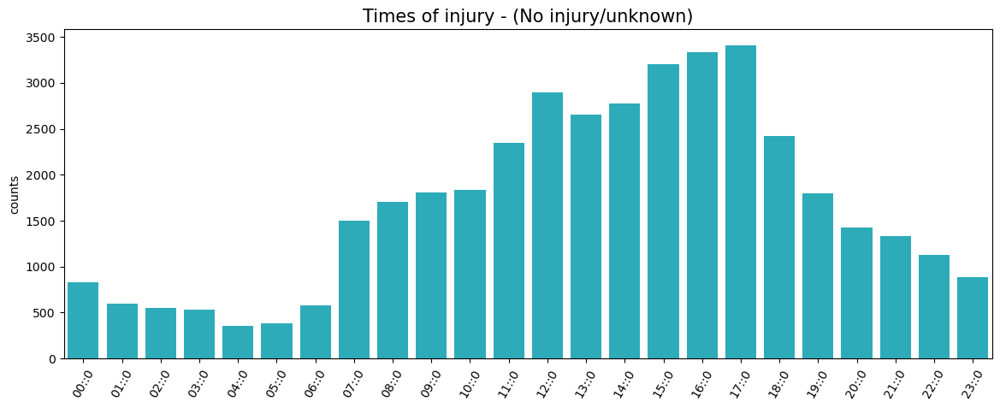

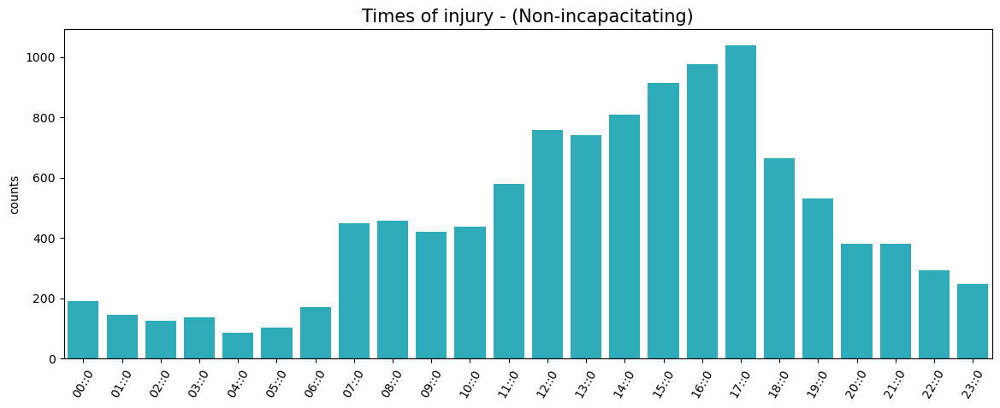

In [55]:
grouped_injury_types = df.groupby(["Injury Type", "Hour"]).size().reset_index(name="counts")
grouped_injury_types.head()
for i in grouped_injury_types["Injury Type"].unique():
    injury_type = grouped_injury_types[grouped_injury_types["Injury Type"] == i]
    
    plt.figure(figsize=(14,5))
    sns.barplot(data=injury_type, x="Hour", y="counts", color=col_pal[-1])
    plt.title(f"Times of injury - ({i})", fontsize=15)
    plt.xlabel("")
    plt.xticks(rotation=60)
    plt.show()


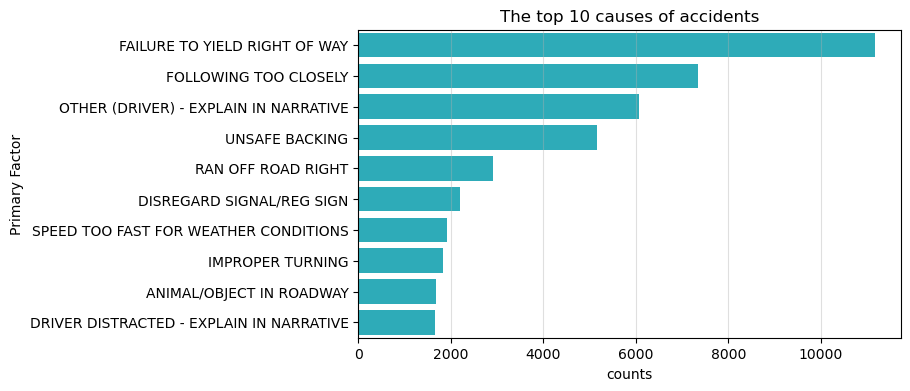

In [57]:
grouped_primary_factor = df.groupby("Primary Factor").size().reset_index(name="counts")
grouped_primary_factor = grouped_primary_factor.sort_values(by="counts", ascending=False).head(10)
plt.figure(figsize=(7,4))
sns.barplot(data=grouped_primary_factor, x="counts", y="Primary Factor", color=col_pal[-1])
plt.grid(axis="x", alpha=0.4)
plt.title("The top 10 causes of accidents")
plt.show()


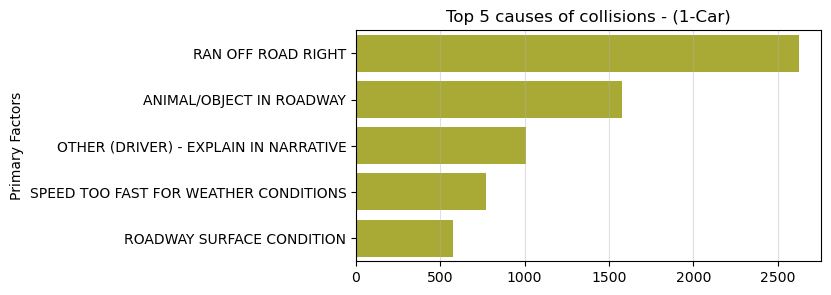

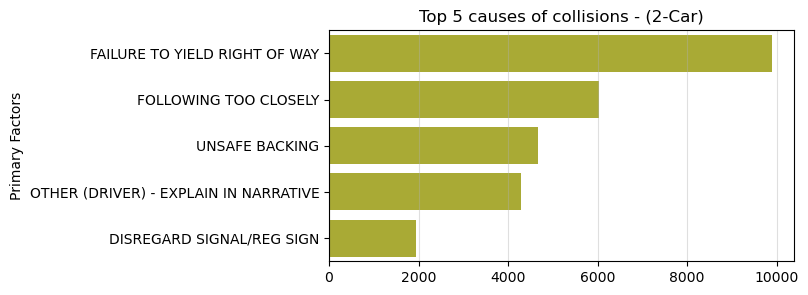

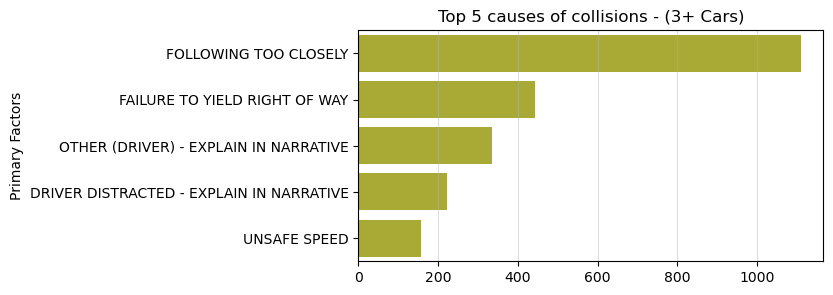

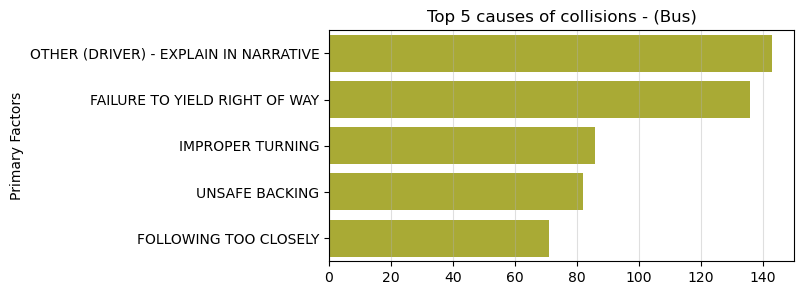

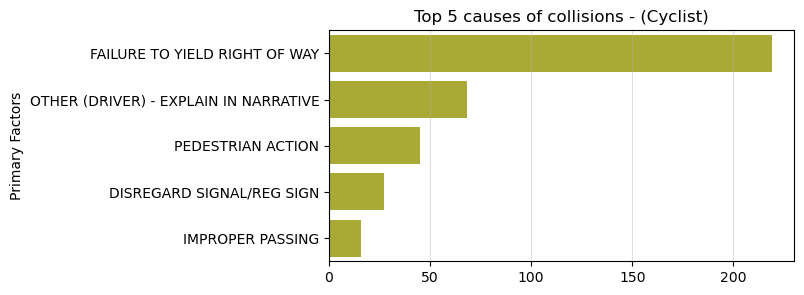

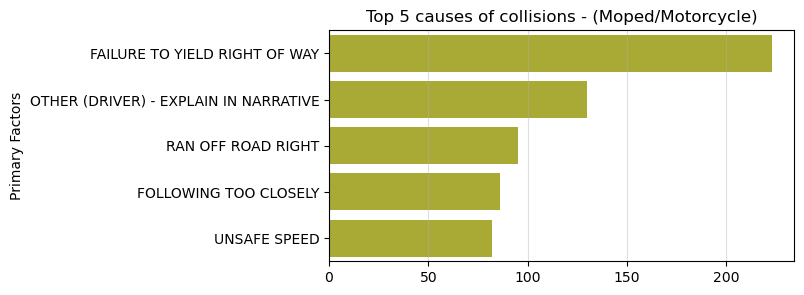

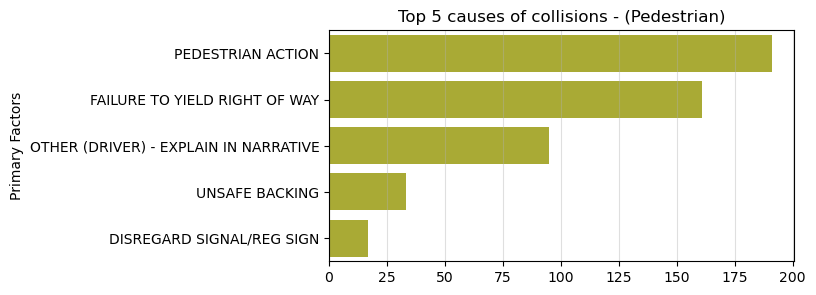

In [59]:
grouped_colision_factors = df.groupby(["Collision Type", "Primary Factor"]).size().reset_index(name="counts")
grouped_colision_factors.head()
for i in grouped_colision_factors["Collision Type"].unique():
    grouped_collision = grouped_colision_factors[grouped_colision_factors["Collision Type"] == i]
    grouped_collision = grouped_collision.sort_values(by="counts", ascending=False).head(5)
    
    plt.figure(figsize=(6,3))
    sns.barplot(data=grouped_collision, x="counts", y="Primary Factor", color=col_pal[-2])
    plt.ylabel("Primary Factors"), plt.xlabel(""), plt.grid(axis="x", alpha=0.4)
    plt.title(f"Top 5 causes of collisions - ({i})") 
    plt.show()


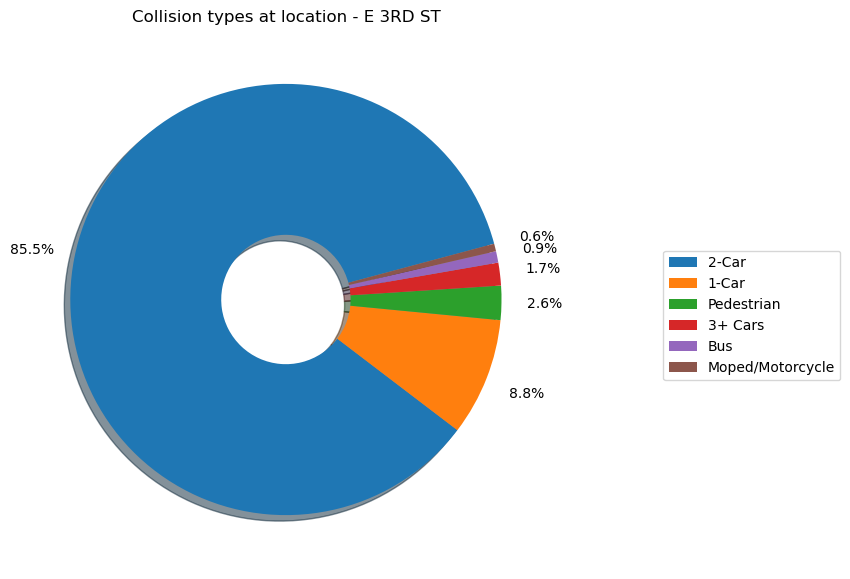

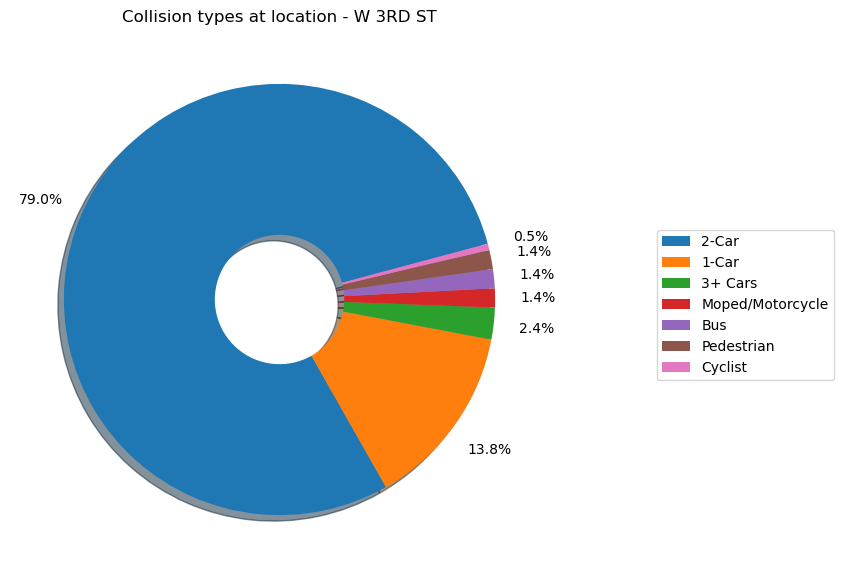

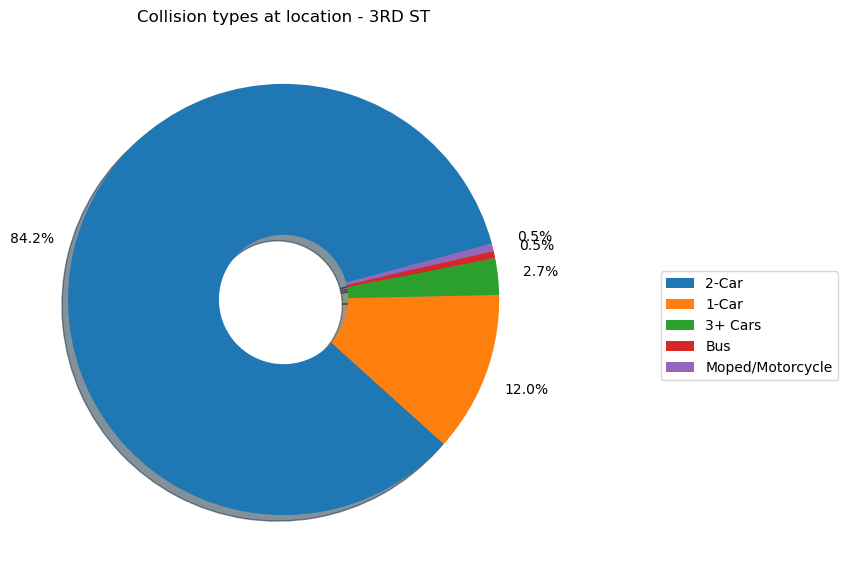

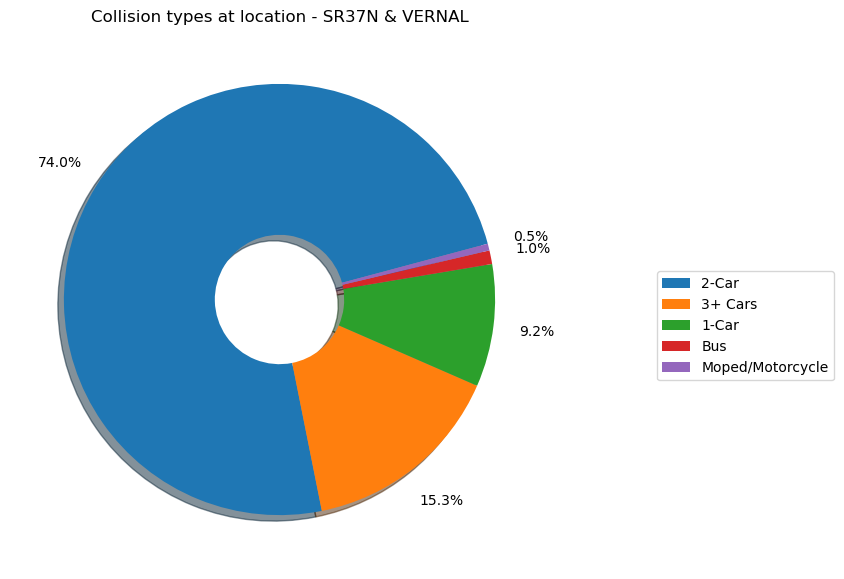

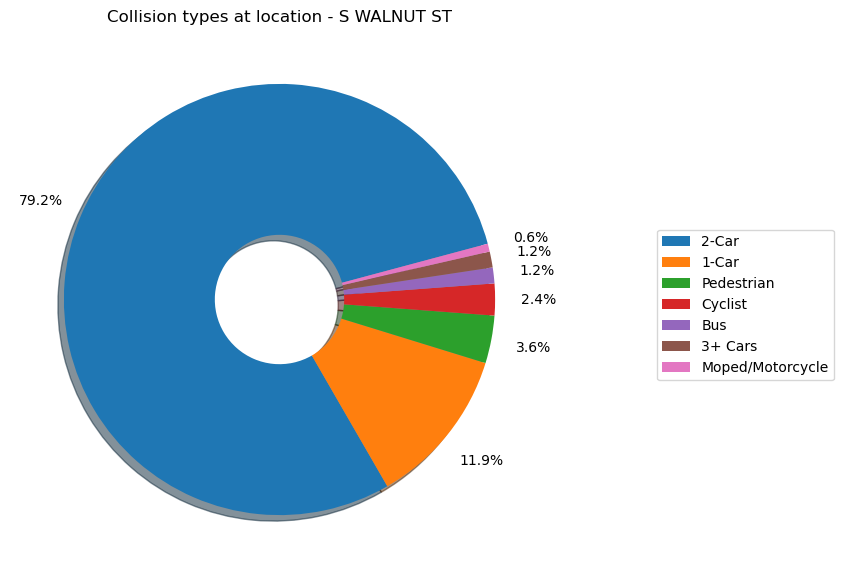

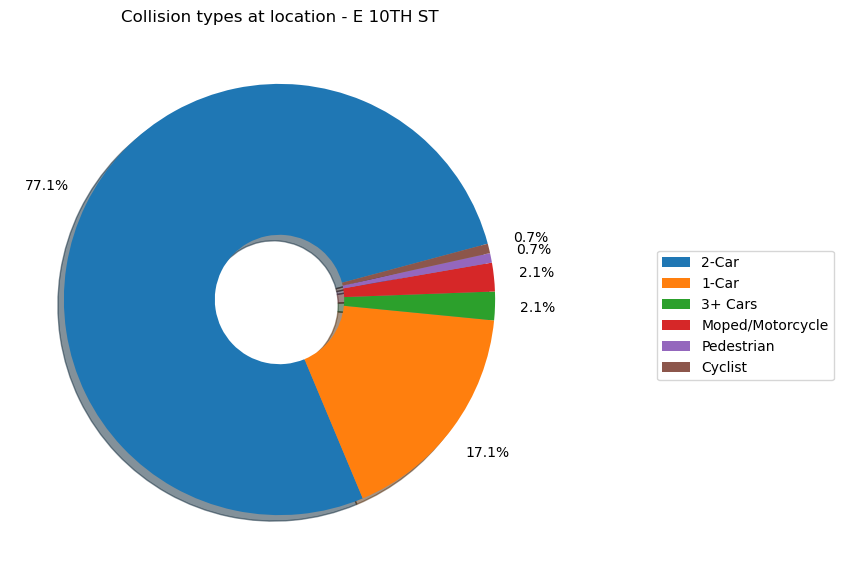

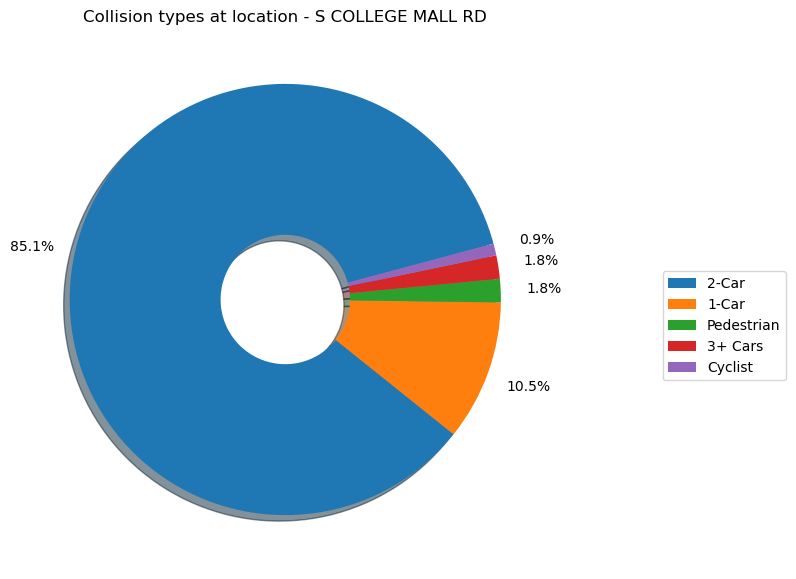

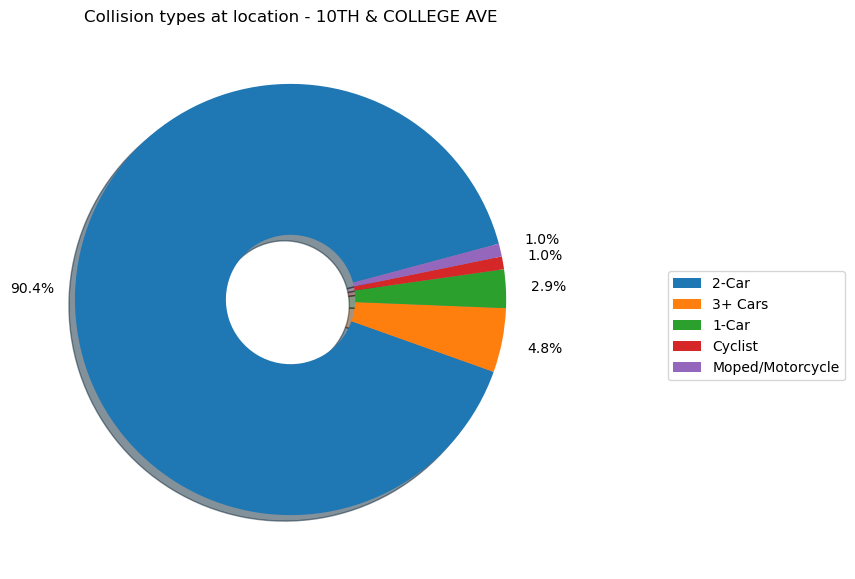

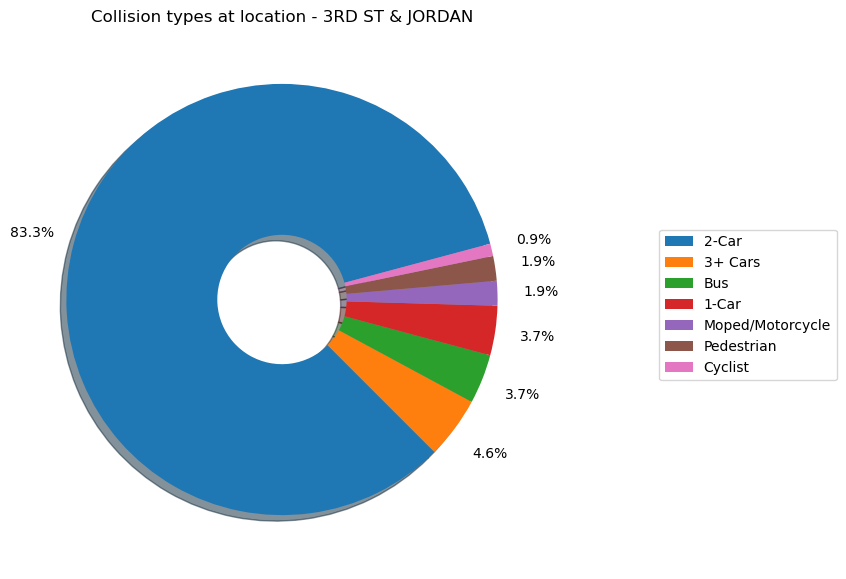

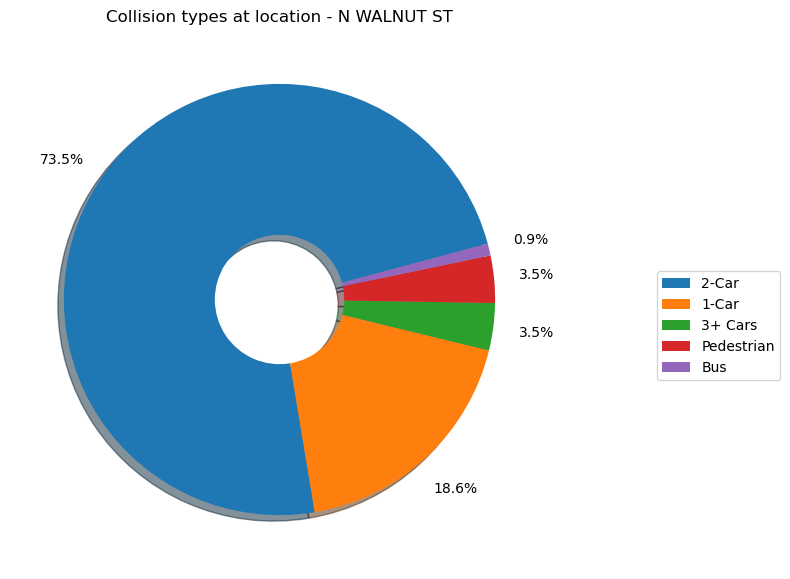

In [61]:
Top10_reported_location = df.groupby(["Reported_Location", "Collision Type"])["Reported_Location"].count().reset_index(name="counts")
Top10_reported_location = Top10_reported_location.sort_values(by="counts", ascending=False)
Top10_reported_location.head()
location_list = Top10_reported_location.head(10).Reported_Location.values

for i in location_list:
    grouped = Top10_reported_location[Top10_reported_location.Reported_Location == i]
    
    plt.figure(figsize=(7,7))
    plt.pie(x=grouped["counts"], shadow=True, radius=1.3-0.3, wedgeprops=dict(width=0.7),
            startangle=15, autopct="%.1f%%", pctdistance=1.20)
    plt.legend(labels=grouped["Collision Type"], loc= (1.2,0.35))
    plt.title(f"Collision types at location - {i}")
    plt.show()


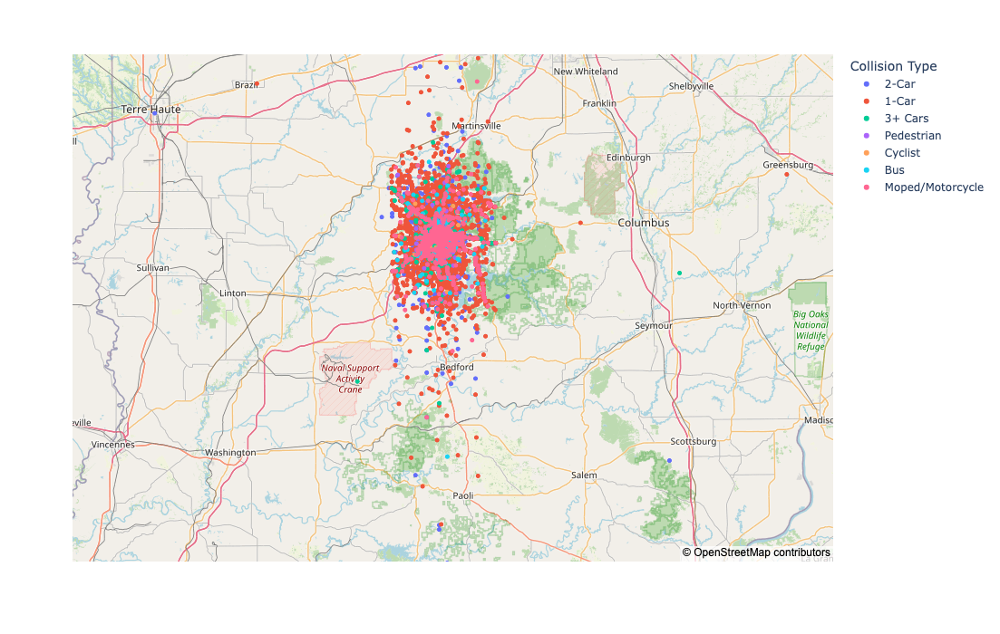

In [63]:
map_df = df[["Collision Type", "Injury Type", "Latitude", "Longitude"]]
map_df.head()
fig = px.scatter_mapbox(data_frame=map_df, lat="Latitude", lon="Longitude", color="Collision Type",
                        center={"lat":39, "lon":-86.5}, mapbox_style= "open-street-map",
                        hover_data=["Injury Type"], height=700, width=1200)
fig.show()
